# Exploratory Data Analysis 
---
Using different plots and viz to display the relationship between variables

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [2]:
variables = pd.read_csv('Data/1. Data Cleaning.csv')
map_df = pd.read_csv('Data/Map_DF.csv')

In [3]:
mainvar = ['Day', 'Month', 'Year', 'Make', 'Aircraft.damage', 'Aircraft.Category', 'Number.of.Engines', 'Engine.Type', 'Weather.Condition', 'Broad.phase.of.flight', 'Fatal', 'Injured', 'Uninjured', 'Fatal.Cat', 'Fatal.Count', 'Latitude', 'Longitude']
df = pd.DataFrame(variables[mainvar])# Extract only the variables we need
df

,Day,Month,Year,Make,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Weather.Condition,Broad.phase.of.flight,Fatal,Injured,Uninjured,Fatal.Cat,Fatal.Count,Latitude,Longitude
0,1,1,1982,BEECH,Substantial,NaN,1,Reciprocating,VMC,Landing,0.0,0.0,1.0,Non-Fatal,0,0.000000,0.000000
1,2,1,1982,BEECH,Destroyed,Airplane,1,Reciprocating,IMC,Cruise,2.0,0.0,0.0,Fatal,2,0.000000,0.000000
2,6,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Climb,0.0,0.0,3.0,Non-Fatal,0,0.000000,0.000000
3,7,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,VMC,Approach,0.0,0.0,1.0,Non-Fatal,0,0.000000,0.000000
4,12,1,1982,BEECH,Substantial,Airplane,1,Reciprocating,IMC,Descent,0.0,1.0,1.0,Non-Fatal,0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40675,29,10,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,53.353333,-168.240000
40676,3,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,0.0,2.0,Non-Fatal,0,43.778889,-116.938611
40677,20,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Landing,0.0,1.0,1.0,Non-Fatal,0,33.039166,-116.915000
40678,24,11,2007,ROBINSON,Substantial,Helicopter,1,Reciprocating,VMC,Maneuvering,0.0,0.0,1.0,Non-Fatal,0,36.880000,-76.214167


In [4]:
print("Data type : ", type(df))
print("Data dims : ", df.shape)
print(df.dtypes)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (40680, 17)
Day                        int64
Month                      int64
Year                       int64
Make                      object
Aircraft.damage           object
Aircraft.Category         object
Number.of.Engines          int64
Engine.Type               object
Weather.Condition         object
Broad.phase.of.flight     object
Fatal                    float64
Injured                  float64
Uninjured                float64
Fatal.Cat                 object
Fatal.Count                int64
Latitude                 float64
Longitude                float64
dtype: object


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40680 entries, 0 to 40679
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Day                    40680 non-null  int64  
 1   Month                  40680 non-null  int64  
 2   Year                   40680 non-null  int64  
 3   Make                   40680 non-null  object 
 4   Aircraft.damage        40680 non-null  object 
 5   Aircraft.Category      4857 non-null   object 
 6   Number.of.Engines      40680 non-null  int64  
 7   Engine.Type            40680 non-null  object 
 8   Weather.Condition      40680 non-null  object 
 9   Broad.phase.of.flight  40680 non-null  object 
 10  Fatal                  40680 non-null  float64
 11  Injured                40680 non-null  float64
 12  Uninjured              40680 non-null  float64
 13  Fatal.Cat              40680 non-null  object 
 14  Fatal.Count            40680 non-null  int64  
 15  La

In [6]:
df.to_csv('Data/2. EDA.csv')

# Time-Series Plot 
Accident Count across all airline comapanies over the years

In [7]:
df_time = pd.DataFrame()
df_time['Count'] = df.groupby(['Year','Make']).size()

df_time

Count
Year Make           
1982 BEECH       237
     BELL         95
     BELLANCA     61
     BOEING       29
     CESSNA     1248
...              ...
2007 GRUMMAN      11
     HUGHES       14
     MOONEY       30
     PIPER       247
     ROBINSON     48

[260 rows x 1 columns]

1982    2572
1983    2421
1984    2376
1985    2215
1986    1983
1987    1978
1988    1838
1989    1742
1990    1704
1991    1688
1992    1549
1993    1515
1995    1478
1994    1429
1996    1352
1999    1325
1997    1316
1998    1302
2000    1233
2003    1180
2002    1172
2001    1156
2005    1101
2004    1072
2007    1005
2006     978
Name: Year, dtype: int64


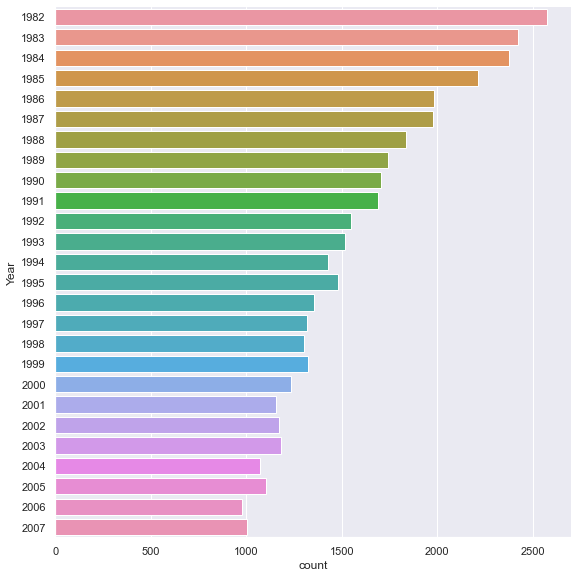

In [8]:
print(df["Year"].value_counts())
sb.catplot(y = "Year", data = df, kind = "count", height = 8)
plt.savefig('Images/CatPlot (Overall).png')

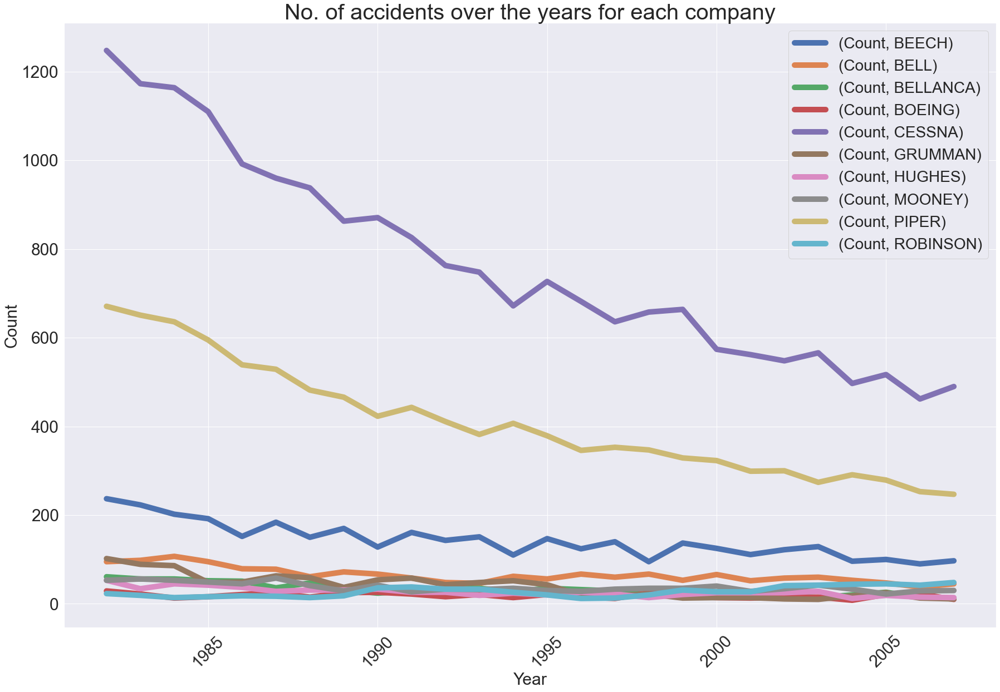

<Figure size 432x288 with 0 Axes>

In [9]:
## TIME-SERIES PLOT
df_time.unstack().plot(figsize=(30,20), linewidth=10, legend='Make')
plt.legend(fontsize = 28)
plt.xticks(rotation=45)
plt.xlabel('Year', size = 30)
plt.ylabel('Count', size = 30)
plt.title('No. of accidents over the years for each company', size = 40)
plt.xticks(size = 30)
plt.yticks(size = 30)
plt.show()
plt.savefig('Images/Time Series Plot.png')

In [10]:
yr, comp, count = [], [], []
years = list(range(1982, 2008))
companies = ["CESSNA", "PIPER", "BEECH", "BELL", "BOEING", "MOONEY", "ROBINSON", "GRUMMAN", "BELLANCA", "HUGHES"]
count = []
for item in years:
    for make in companies:
        df_year = pd.DataFrame(df[df['Year'] == str(item)])
        df_year_make = pd.DataFrame(df_year[df_year['Make'] == make])
        df_year_count = len(df_year_make)
        
        yr.append(item)
        comp.append(make)
        count.append(df_year_count)
        
df1 = pd.DataFrame()
df1['Year'] = yr
df1['Make'] = comp
df1['Count'] = count

df1       

,Year,Make,Count
0,1982,CESSNA,0
1,1982,PIPER,0
2,1982,BEECH,0
3,1982,BELL,0
4,1982,BOEING,0
...,...,...,...
255,2007,MOONEY,0
256,2007,ROBINSON,0
257,2007,GRUMMAN,0
258,2007,BELLANCA,0


/Users/ester/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


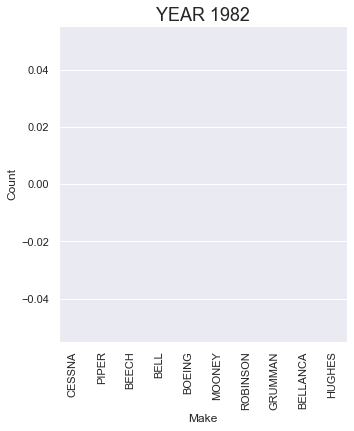

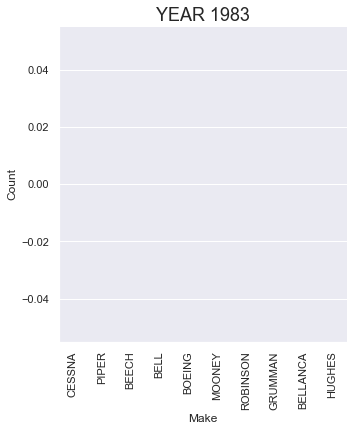

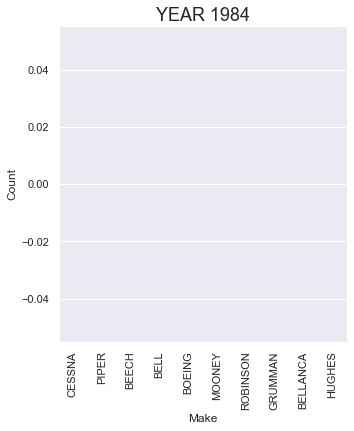

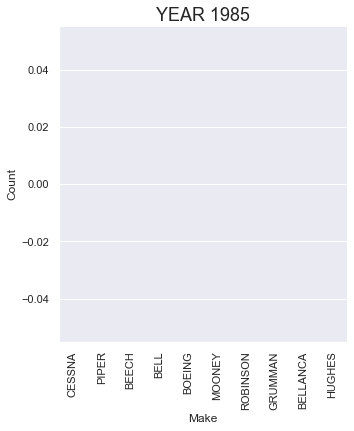

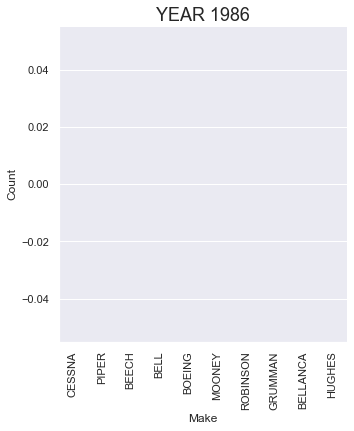

...

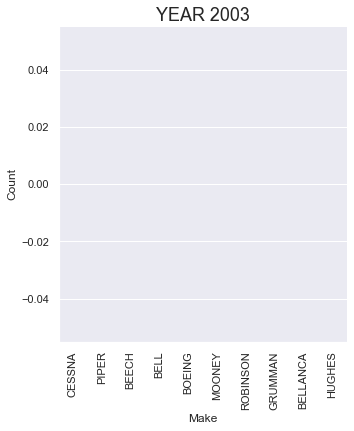

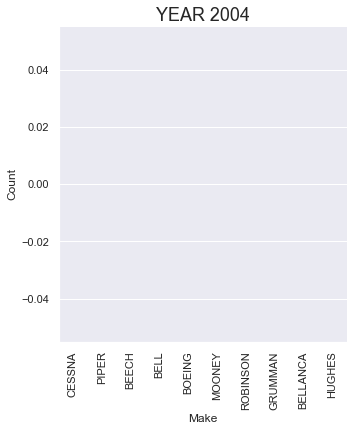

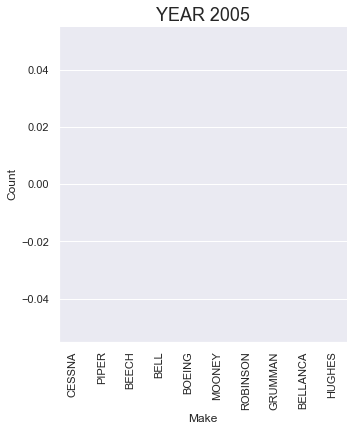

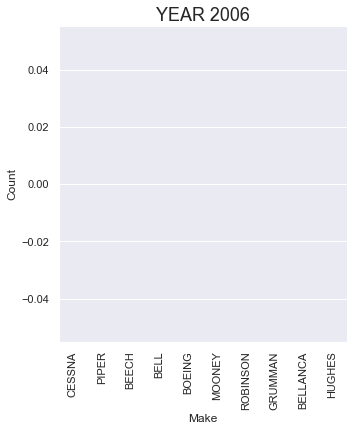

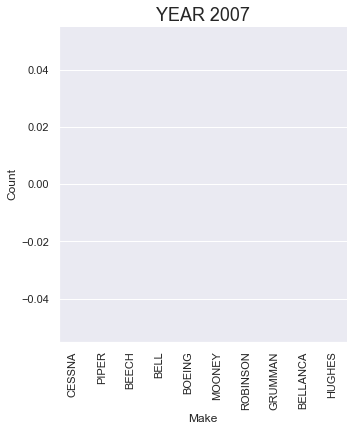

In [11]:
startYear=1982
endYear=2007

yr = list(range(startYear, endYear+1))

for i in yr:
    df_hplot = pd.DataFrame(df1[df1['Year'] == i])
    df_hplot = df_hplot.drop(columns=['Year'])
    df_hplot
    ax = sb.catplot(x="Make", y="Count", kind="bar", data=df_hplot)
    plt.title("YEAR " + str(i), fontsize=18)
    plt.xticks(rotation='90')
    plt.savefig('Images/CatPlot (Individual)/Year {}.png'.format(i))

## Fatal Count + Line Graph

In [12]:
line_1_df = df[df["Fatal.Cat"] == "Fatal"]

line_1_df
#line_1_df.reset_index(drop = True, inplace = True)


line_1 = line_1_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Fatal Accidents')
line_1.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Fatal Table")
print("_" * 20)
display(line_1)

line_2_df = df[df["Fatal.Cat"] == "Non-Fatal"]

line_2_df
#line_2_df.reset_index(drop = True, inplace = True)


line_2 = line_2_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Non-Fatal Accidents')
line_2.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Non-Fatal")
print("_" * 20)
display(line_2)

line_3_df = df[df["Fatal.Cat"] == "Not Reported"]

line_3_df
#line_3_df.reset_index(drop = True, inplace = True)


line_3 = line_3_df["Year"].value_counts().sort_index().rename_axis('Year').reset_index(name = 'Number of Not Reported Accidents')
line_3.sort_values(by = ["Year"])

print("_" * 20)
print()
print("Not Reported Table")
print("_" * 20)
display(line_3)


____________________

Fatal Table
____________________


,Year,Number of Fatal Accidents
0,1982,443
1,1983,388
2,1984,382
3,1985,371
4,1986,339
5,1987,343
6,1988,340
7,1989,317
8,1990,317
9,1991,318


____________________

Non-Fatal
____________________


,Year,Number of Non-Fatal Accidents
0,1982,2129
1,1983,2033
2,1984,1994
3,1985,1843
4,1986,1644
5,1987,1635
6,1988,1498
7,1989,1425
8,1990,1387
9,1991,1370


____________________

Not Reported Table
____________________


,Year,Number of Not Reported Accidents
0,1985,1
1,1994,1


In [13]:
df_line = pd.merge(line_1, line_2, how = 'outer')

df_lineAll = pd.merge(df_line, line_3, how = "outer")

df_lineAll = df_lineAll.sort_values(by=["Year"]).reset_index(drop = True).fillna(0)

df_lineAll

,Year,Number of Fatal Accidents,Number of Non-Fatal Accidents,Number of Not Reported Accidents
0,1982,443,2129,0.0
1,1983,388,2033,0.0
2,1984,382,1994,0.0
3,1985,371,1843,1.0
4,1986,339,1644,0.0
5,1987,343,1635,0.0
6,1988,340,1498,0.0
7,1989,317,1425,0.0
8,1990,317,1387,0.0
9,1991,318,1370,0.0


<AxesSubplot:xlabel='Year', ylabel='Number of Fatal Accidents'>

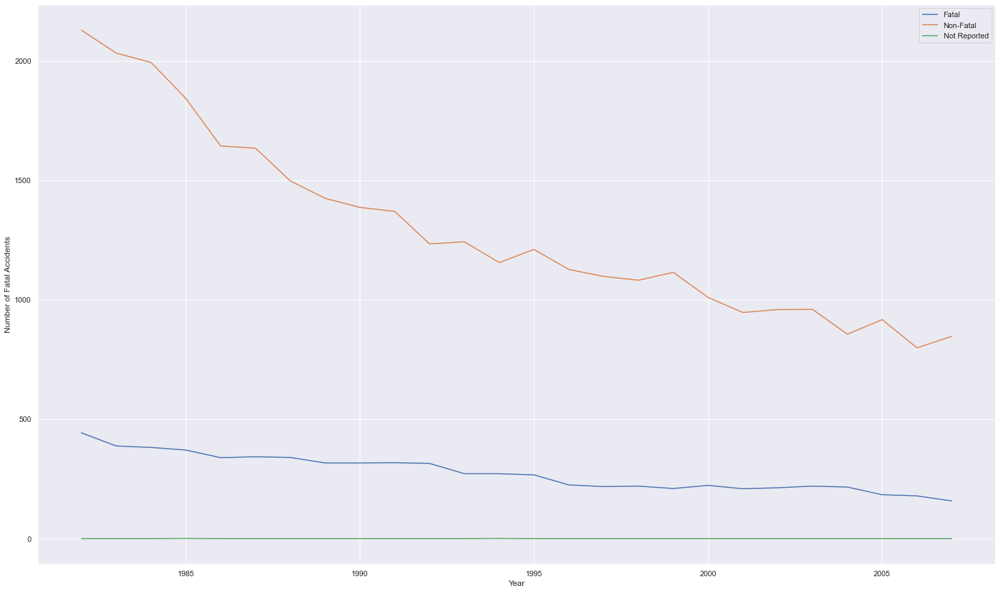

In [14]:
f = plt.figure(figsize=(25, 15))
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Fatal Accidents", label = "Fatal")
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Non-Fatal Accidents", label = "Non-Fatal")
sb.lineplot(data = df_lineAll, x = "Year", y = "Number of Not Reported Accidents", label = "Not Reported")

# Finding Correlation
### Grouping all categorical data together and find the relation

In [15]:
cat_list = ["Aircraft.damage", "Engine.Type", "Number.of.Engines", "Weather.Condition", "Broad.phase.of.flight", "Fatal.Cat"]

df_cat = df[cat_list]

df_cat

,Aircraft.damage,Engine.Type,Number.of.Engines,Weather.Condition,Broad.phase.of.flight,Fatal.Cat
0,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
1,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
2,Substantial,Reciprocating,1,VMC,Climb,Non-Fatal
3,Substantial,Reciprocating,1,VMC,Approach,Non-Fatal
4,Substantial,Reciprocating,1,IMC,Descent,Non-Fatal
...,...,...,...,...,...,...
40675,Substantial,Reciprocating,1,VMC,Maneuvering,Non-Fatal
40676,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
40677,Substantial,Reciprocating,1,VMC,Landing,Non-Fatal
40678,Substantial,Reciprocating,1,VMC,Maneuvering,Non-Fatal


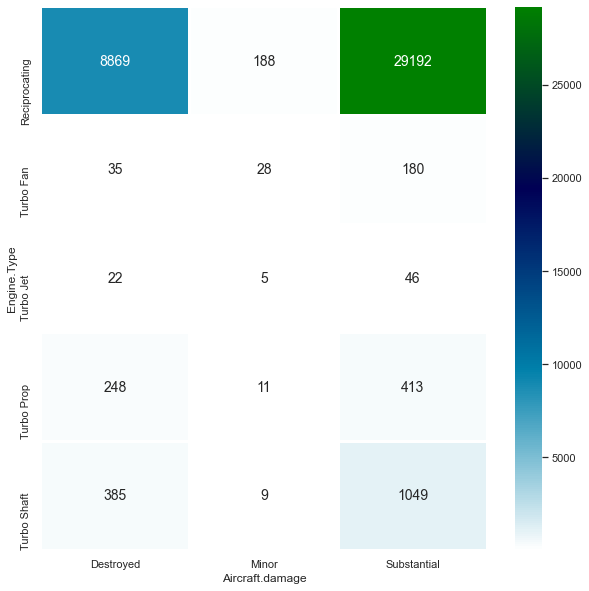

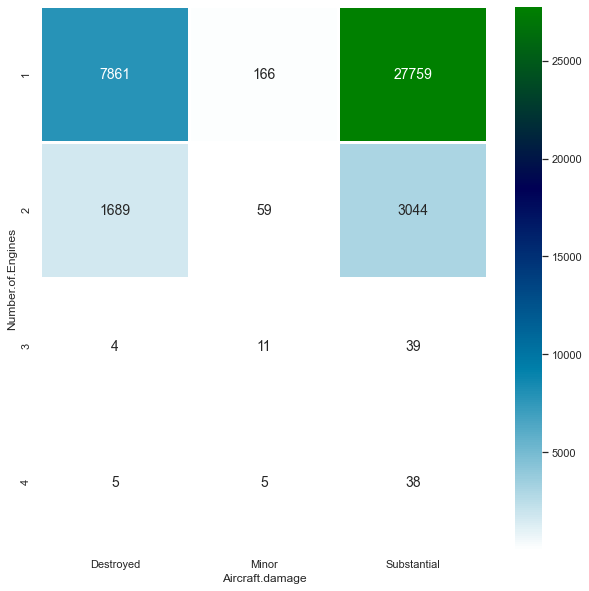

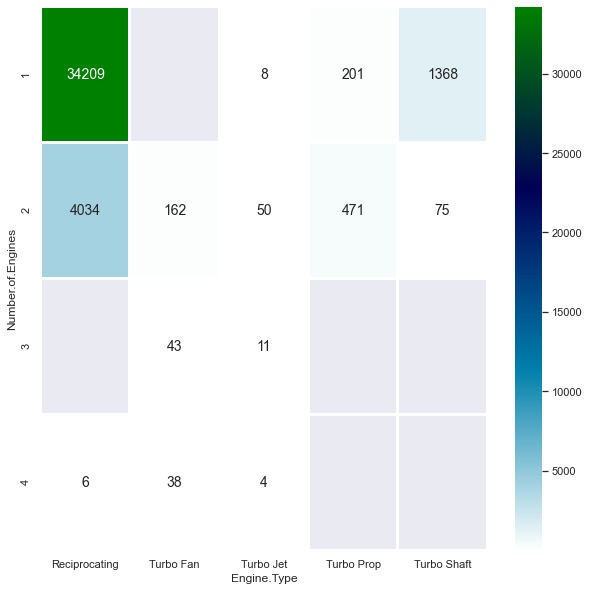

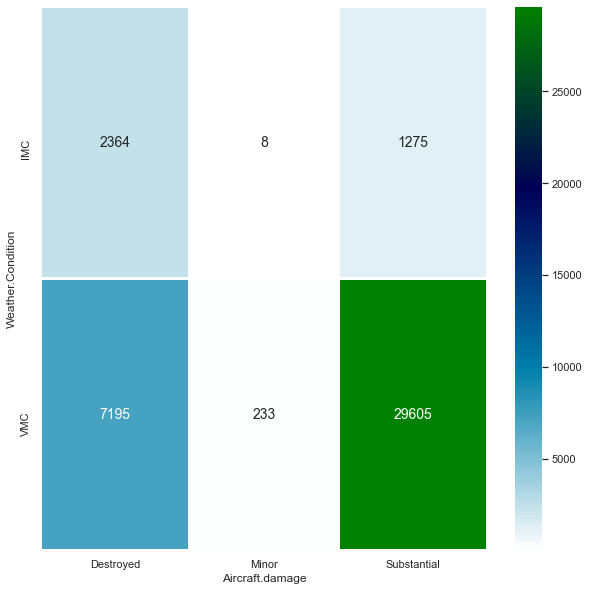

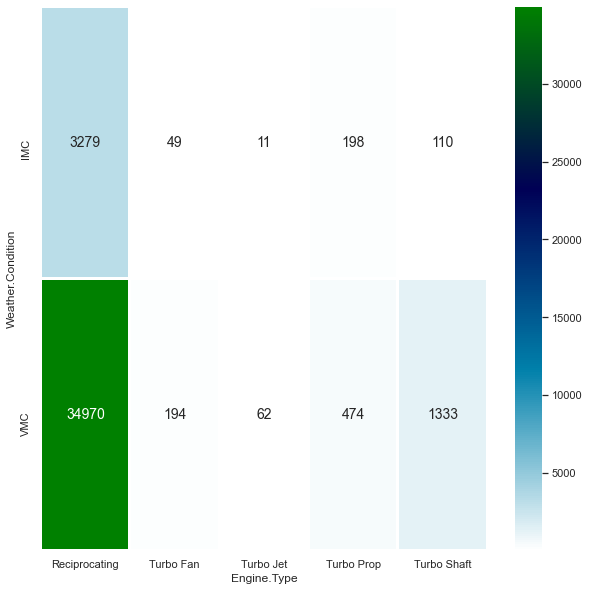

...

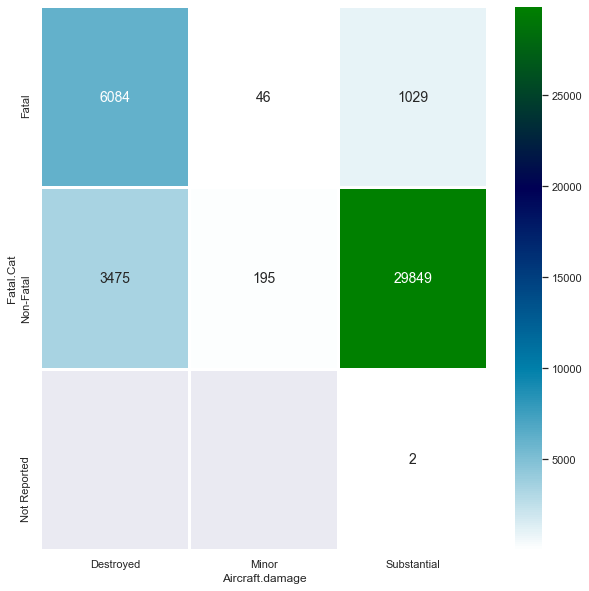

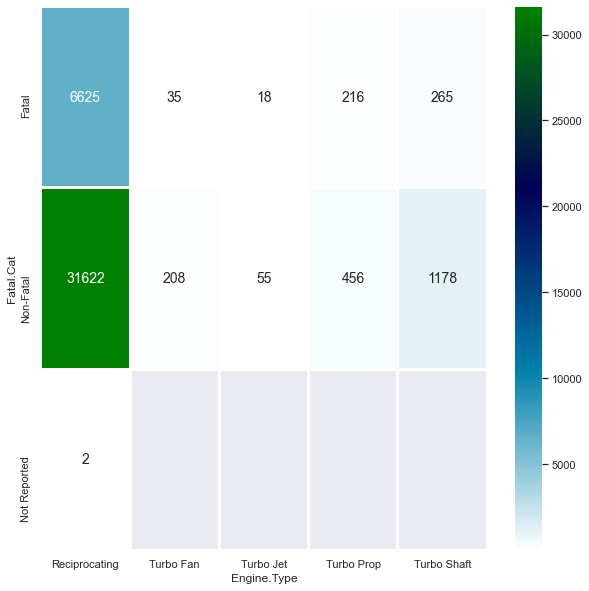

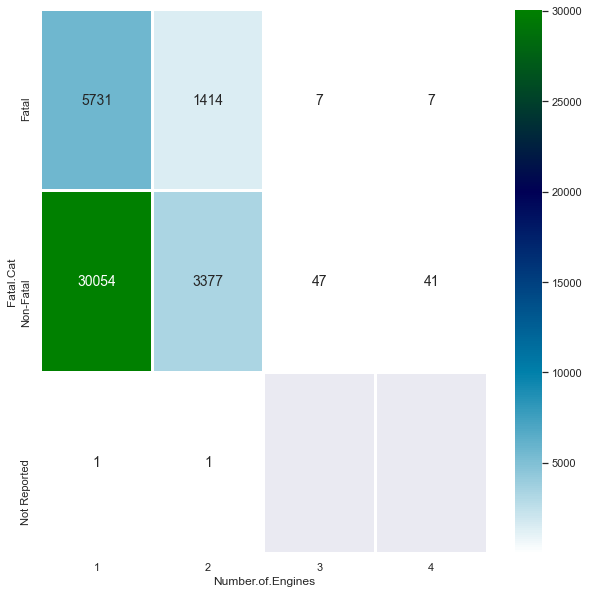

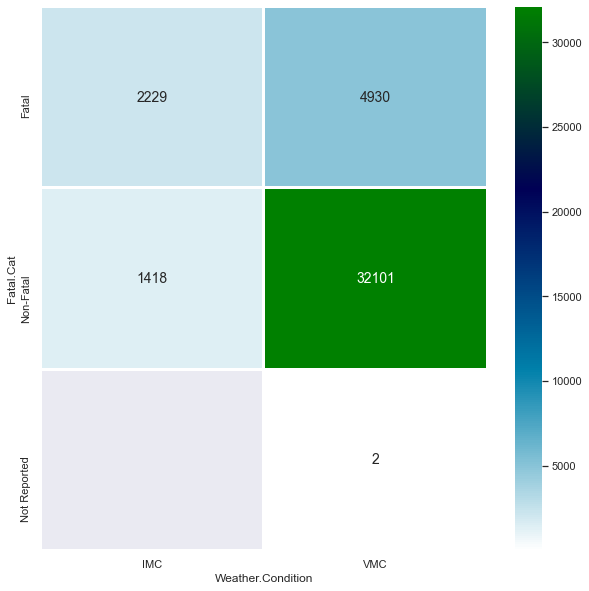

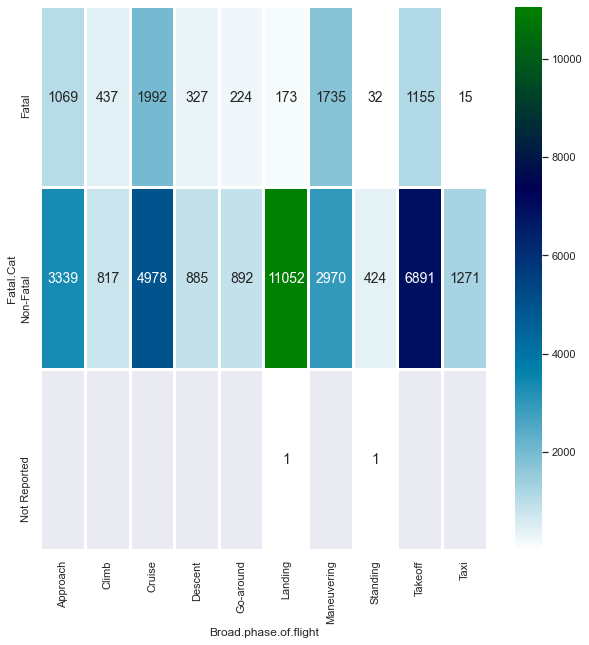

In [16]:
countCORRWITHALLVARIABLES=0
for i in range(len(df_cat.columns)):
    for j in range(len(df_cat.columns)):
        if (i == j) or (i < j):
            continue
        f = plt.figure(figsize=(10, 10))
        ax = sb.heatmap(df_cat.groupby([df_cat.columns[i], df_cat.columns[j]]).size().unstack(), linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
        figure = ax.get_figure()    
        figure.savefig('Images/Correlation/ALL/Correlation Against ALLVARIABLES - %d.png'%countCORRWITHALLVARIABLES)
        countCORRWITHALLVARIABLES+=1


# Finding Correlation for each Variables
### Correlation against Fatal.Cat

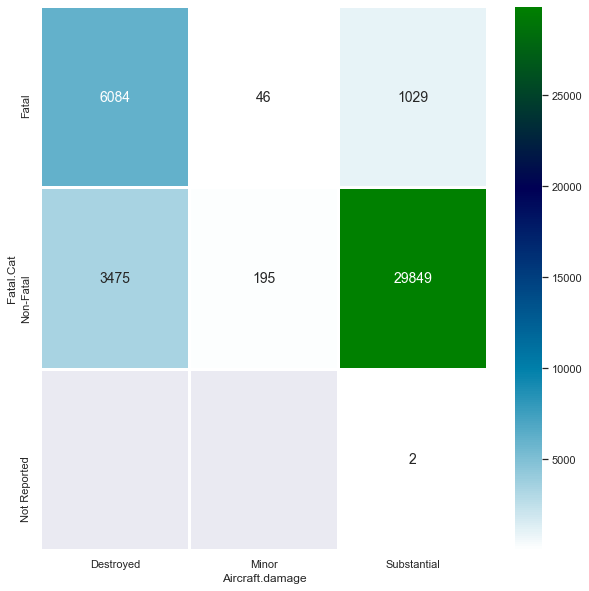

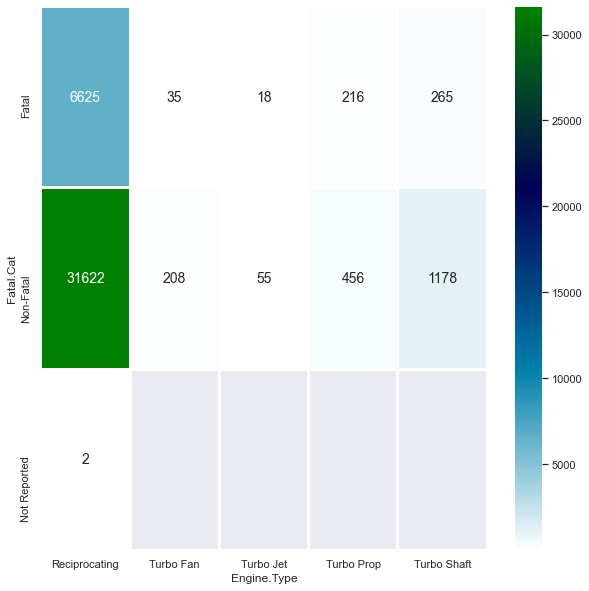

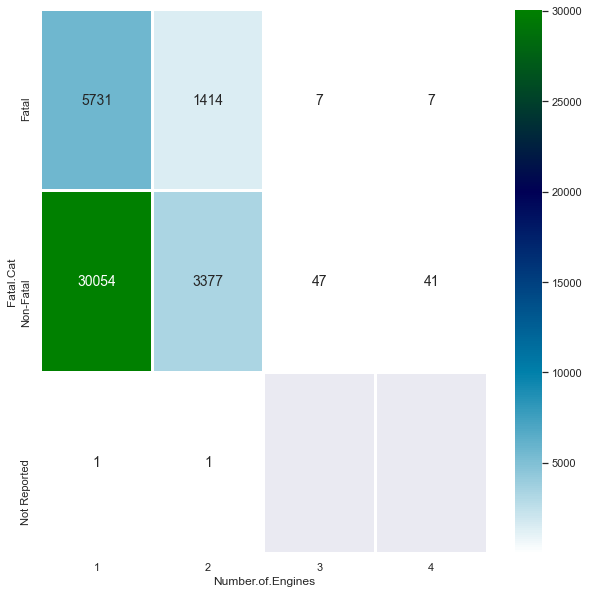

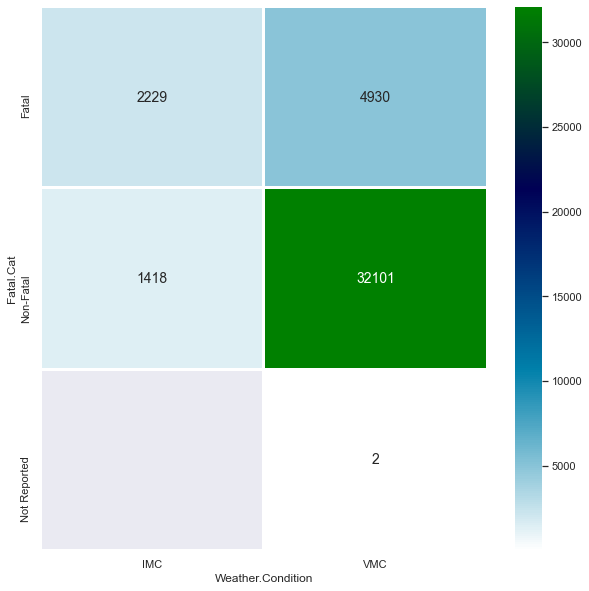

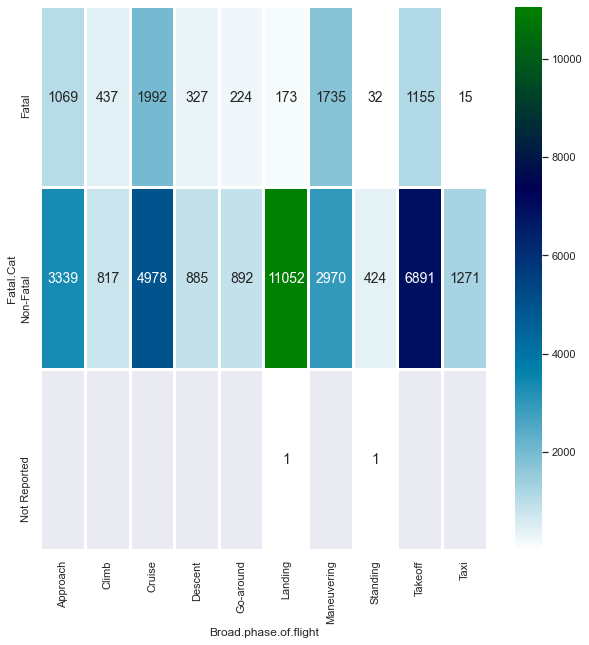

In [17]:
countCORRagainstfatCAT=0
for i in range(len(df_cat.columns)):
    if df_cat.columns[i] == "Fatal.Cat":
        continue
    f = plt.figure(figsize=(10, 10))
    ax = sb.heatmap(df_cat.groupby([df_cat["Fatal.Cat"], df_cat.columns[i]]).size().unstack(),
            linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
    
    figure = ax.get_figure()    
    figure.savefig('Images/Correlation/Fatal Cat/Correlation Only FatalCat - %d.png'%countCORRagainstfatCAT)
    countCORRagainstfatCAT+=1
   

# Finding Correlation
## Fatal Results ONLY

In [18]:
df_catfat = df_cat[df_cat["Fatal.Cat"] == "Fatal"]

df_catfat.reset_index(drop = True, inplace = True)

df_catfat

,Aircraft.damage,Engine.Type,Number.of.Engines,Weather.Condition,Broad.phase.of.flight,Fatal.Cat
0,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
1,Destroyed,Reciprocating,2,VMC,Takeoff,Fatal
2,Destroyed,Reciprocating,1,IMC,Maneuvering,Fatal
3,Destroyed,Reciprocating,2,IMC,Cruise,Fatal
4,Destroyed,Reciprocating,1,IMC,Cruise,Fatal
...,...,...,...,...,...,...
7154,Substantial,Reciprocating,1,VMC,Maneuvering,Fatal
7155,Destroyed,Reciprocating,1,IMC,Maneuvering,Fatal
7156,Substantial,Reciprocating,1,VMC,Approach,Fatal
7157,Destroyed,Reciprocating,1,VMC,Cruise,Fatal


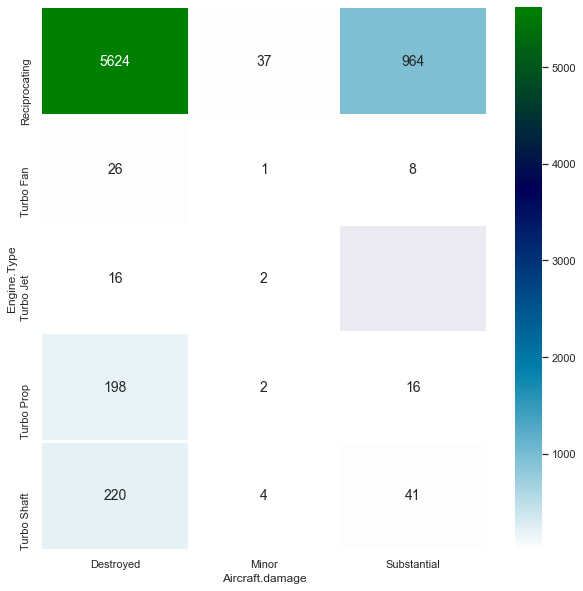

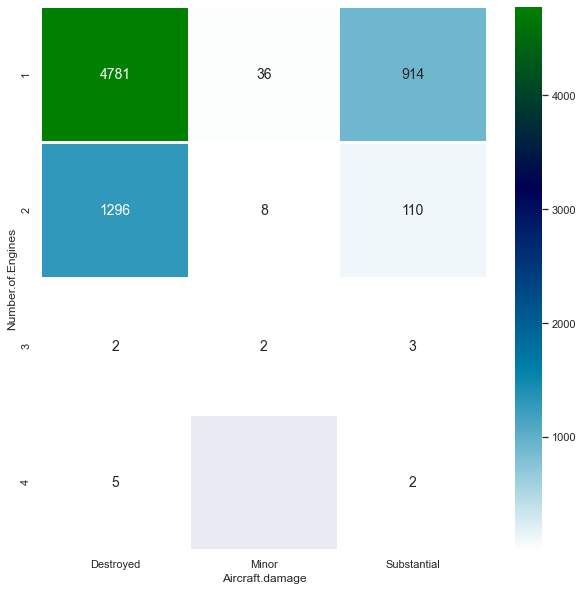

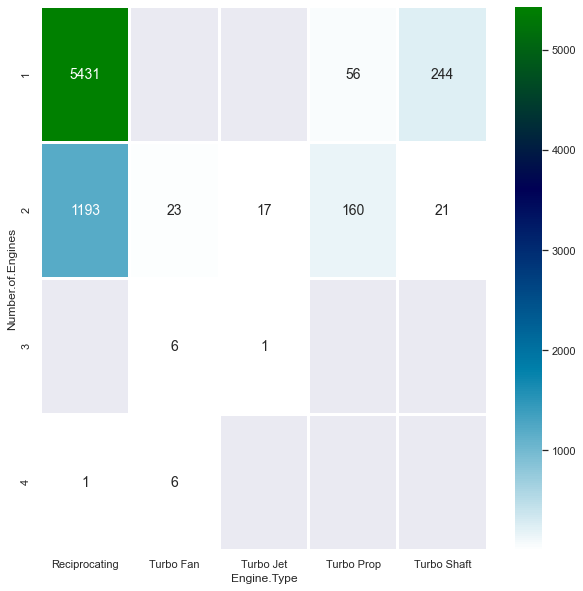

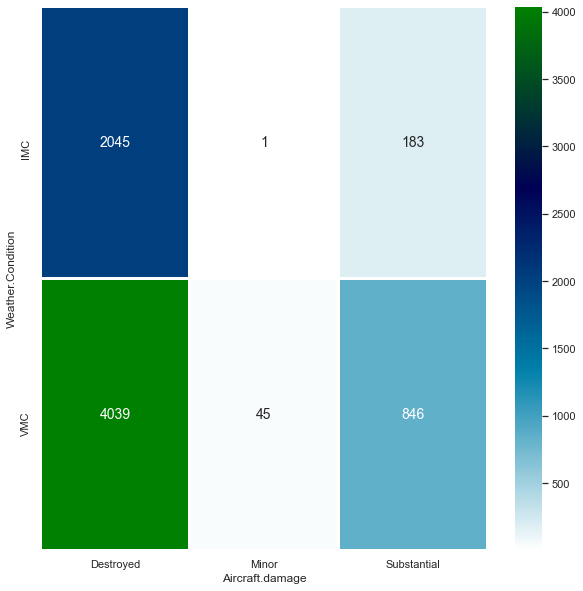

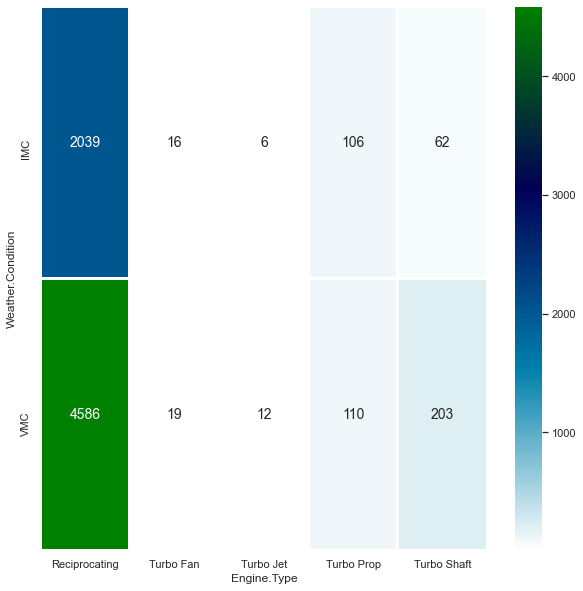

...

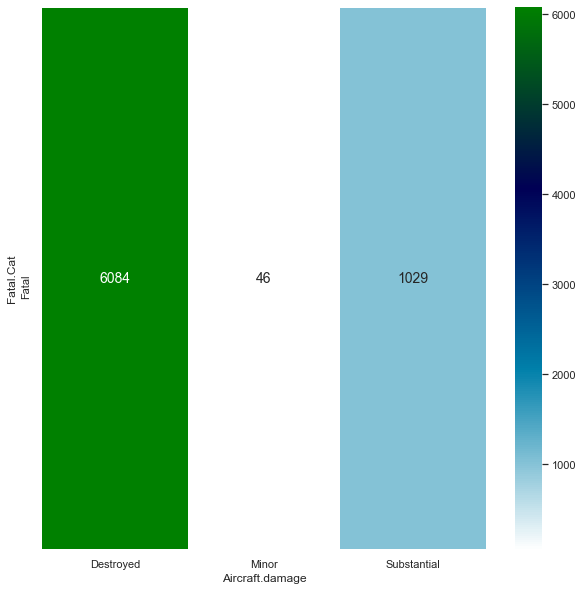

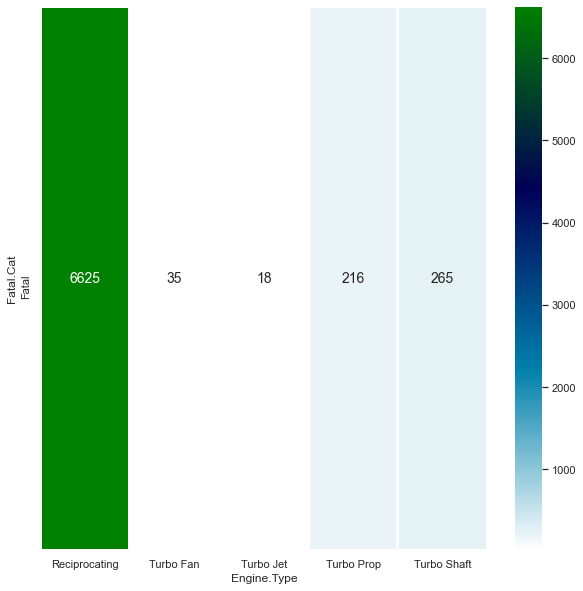

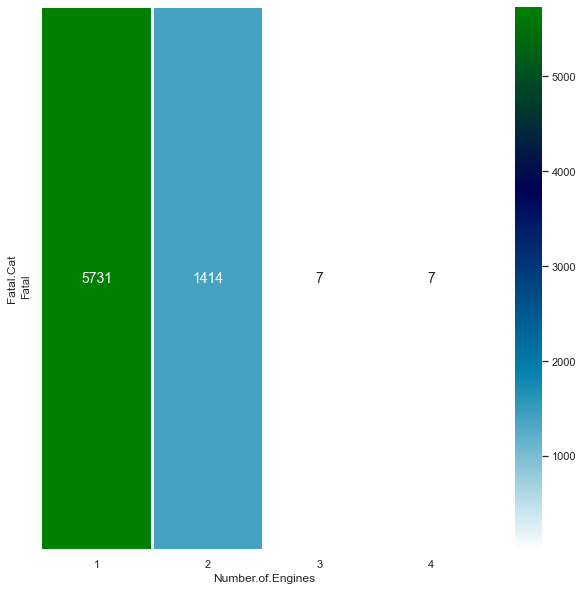

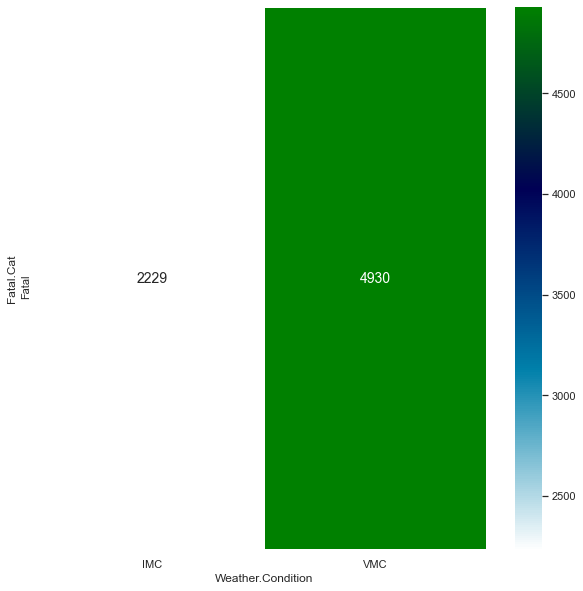

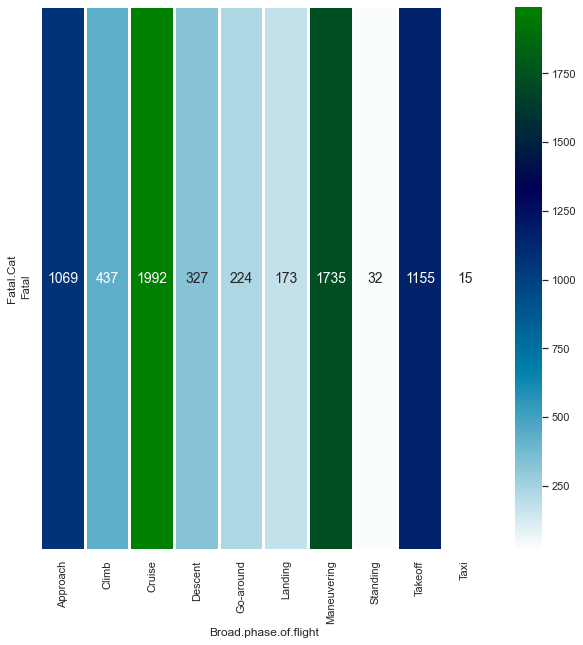

In [19]:
countONLYFATAL=0
for i in range(len(df_catfat.columns)):
    for j in range(len(df_catfat.columns)):
        if (df_catfat.columns[j] == "Fatal.Cat"):
            continue
        if (i == j) or (i < j):
            continue
        f = plt.figure(figsize=(10, 10))
        ax = sb.heatmap(df_catfat.groupby([df_catfat.columns[i], df_catfat.columns[j]]).size().unstack(),
                   linewidths = 2, annot = True, annot_kws = {"size": 14}, cmap = 'ocean_r', fmt='g')
        figure = ax.get_figure()    
        figure.savefig('Images/Correlation/Fatal ONLY/Correlation Only Fatal - %d.png'%countONLYFATAL)
        countONLYFATAL+=1
   

# Map Plot


Estimated number of clusters: 37
Estimated number of noise points: 2464


DBSCAN(eps=0.7, min_samples=10)

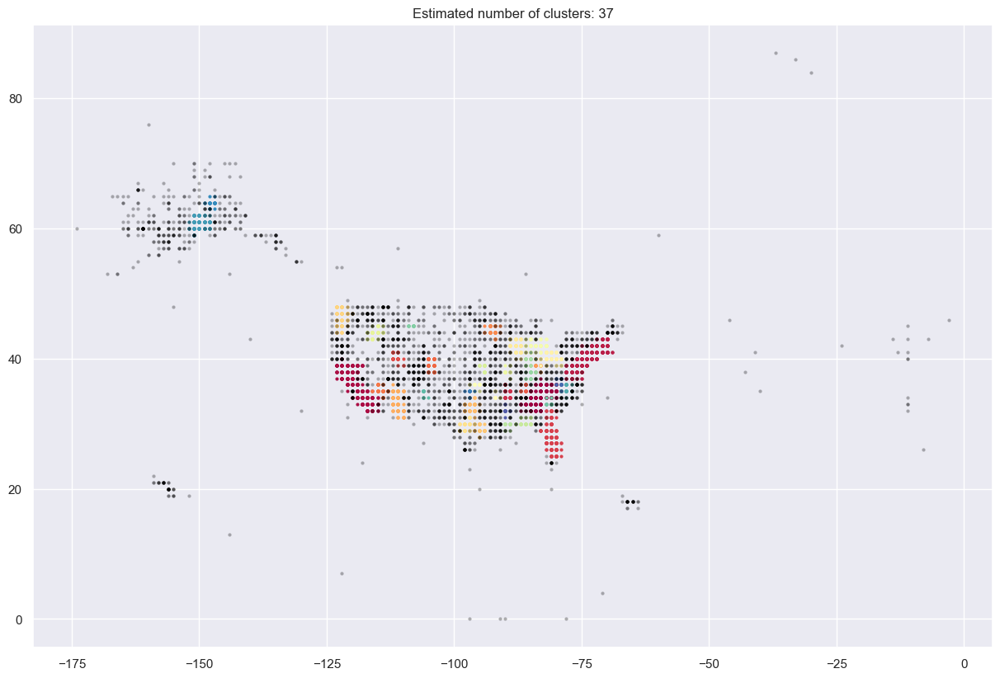

In [20]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

X = pd.DataFrame(map_df[["Latitude", "Longitude"]]).dropna()
X.reset_index(drop=True,inplace=True)
X_fixed = X[(X['Longitude'].astype(float).astype(int) < 0) & (X['Latitude'].astype(float).astype(int) > -20)]
X_fixed

db = DBSCAN(eps=0.7, min_samples=10).fit(X_fixed,sample_weight=0.5)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)


display(db)
# #############################################################################
# Plot result
import matplotlib.pyplot as plt

#img = plt.imread("Map.png")


# Black removed and is used for noise instead.
unique_labels = set(labels)

colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(15, 10), dpi=100)
#plt.imshow(img, zorder=0, extent=[-180, -21, 9, 77])

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]
        a=0.3
    else:
        a=1
    class_member_mask = (labels == k)

    xy = X_fixed[class_member_mask & core_samples_mask]
    plt.plot(xy['Longitude'].astype(float).astype(int), xy['Latitude'].astype(float).astype(int), '.', mfc=tuple(col), mec='none',alpha=a)

    xy = X_fixed[class_member_mask & ~core_samples_mask]
    plt.plot(xy['Longitude'].astype(float).astype(int), xy['Latitude'].astype(float).astype(int), '.', mfc=tuple(col), mec='none',alpha=a)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.savefig('Images/Cluster Map Plot.png')

In [21]:
import folium
from folium.plugins import MarkerCluster

airports = pd.read_csv("../Data/us-airports.csv", encoding = "ISO-8859-1")
airports.head()

subset_data = df[['Year', 'Month', 'Latitude', 'Longitude', 'Aircraft.damage', 'Aircraft.Category', 'Fatal.Cat', 'Fatal.Count']]
#subset_data.dropna(inplace=True)
subset_data['Year'] = subset_data['Year'].astype("int64")
recent = subset_data[(subset_data['Aircraft.Category'] == 'Airplane')]
map_ = folium.Map(location = [40,-90], zoom_start = 4)
marker_cluster = folium.plugins.MarkerCluster().add_to(map_)

large_airports=airports[airports['type'] == 'large_airport']

for i in range(len(large_airports)):
    lon = large_airports.iloc[i]['longitude_deg']
    lat = large_airports.iloc[i]['latitude_deg']
    name=large_airports.iloc[i]['name']
    airport_str = "Name" + str(name)
    folium.Circle(radius=1500 , location = [lat, -abs(lon)], popup = airport_str, icon = folium.Icon(color ="blue",icon='plane')).add_to(map_)        
        


for i in range(len(recent)):
    lon = recent.iloc[i]['Longitude']
    lat = recent.iloc[i]['Latitude']
    month = recent.iloc[i]['Month']
    year = recent.iloc[i]['Year']
    fatal = recent.iloc[i]['Fatal.Cat']
    damage = recent.iloc[i]['Aircraft.damage']
    count = recent.iloc[i]['Fatal.Count']
    popup_str = "Fatal Count" + str(count) +str(",") +str (lon) +str(",") +str(lat)
    if fatal == "Fatal":
        folium.Marker(location = [lat, lon], popup = popup_str, icon = folium.Icon(color ="red")).add_to(marker_cluster) 
    if fatal == "Non-Fatal":
        folium.Marker(location = [lat, lon], popup = popup_str, icon = folium.Icon(color ="blue")).add_to(marker_cluster)
map_

<ipython-input-21-5226119ac5fe>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_data['Year'] = subset_data['Year'].astype("int64")


# Uni-Variate with Survivability Rate & Accident Count
Analysiing the relationship between aircraft damage and the accident rate

#### 1. Weather Condition

<AxesSubplot:>

<AxesSubplot:xlabel='VMC'>

<AxesSubplot:xlabel='IMC'>

VMC Survival Chance: 86.69 %
IMC Survival Chance: 38.88 %


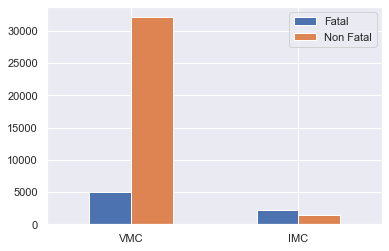

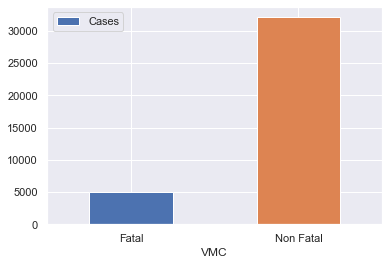

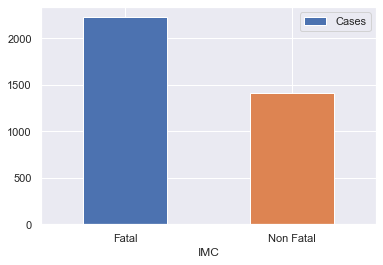

In [22]:
imc = df[df['Weather.Condition']== 'IMC']
imc_Fatal=(sum(imc["Fatal.Cat"] == 'Fatal'))
imc_Non_Fatal=(sum(imc["Fatal.Cat"] == 'Non-Fatal'))

vmc = df[df['Weather.Condition']== 'VMC']
vmc_Fatal=(sum(vmc["Fatal.Cat"] == 'Fatal'))
vmc_Non_Fatal=(sum(vmc["Fatal.Cat"] == 'Non-Fatal'))

Fatal = [vmc_Fatal,imc_Fatal]
Non_Fatal = [vmc_Non_Fatal,imc_Non_Fatal]
index = ['VMC','IMC']
df2 = pd.DataFrame({'Fatal': Fatal,
                   'Non Fatal': Non_Fatal}, index=index)
display(df2.plot.bar(rot=0))
plt.savefig('Images/Survivability Rate/Weather Condition.png')

df2 = pd.DataFrame({'VMC':['Fatal', 'Non Fatal'], 'Cases':[vmc_Fatal,vmc_Non_Fatal]})
display(df2.plot.bar(x='VMC', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/Weather Condition - VMC.png')

df2 = pd.DataFrame({'IMC':['Fatal', 'Non Fatal'], 'Cases':[imc_Fatal,imc_Non_Fatal]})
display(df2.plot.bar(x='IMC', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/Weather Condition - IMC.png')

print("VMC Survival Chance:",round((vmc_Non_Fatal/(vmc_Fatal+vmc_Non_Fatal)*100),2),"%")
print("IMC Survival Chance:",round((imc_Non_Fatal/(imc_Fatal+imc_Non_Fatal)*100),2),"%")



##### 2. Number of Engines

<AxesSubplot:>

<AxesSubplot:xlabel='One Engine'>

<AxesSubplot:xlabel='Two Engine'>

<AxesSubplot:xlabel='Three Engine'>

<AxesSubplot:xlabel='Four Engine'>

One Engine Survival Chance: 83.98 %
Two Engine Survival Chance: 70.49 %
Three Engine Survival Chance: 87.04 %
Four Engine Survival Chance: 85.42 %


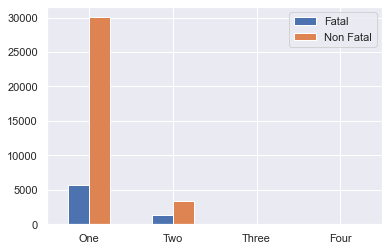

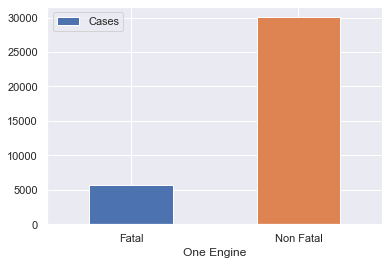

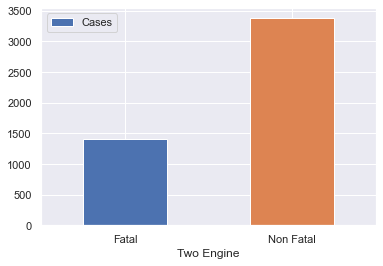

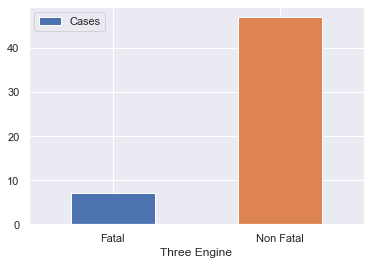

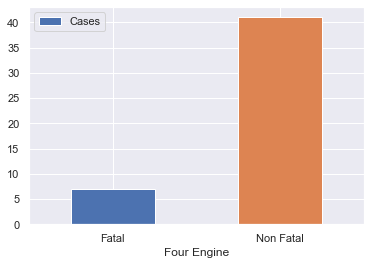

In [23]:
one = df[df['Number.of.Engines']== 1.0]
one_Fatal=(sum(one["Fatal.Cat"] == 'Fatal'))
one_Non_Fatal=(sum(one["Fatal.Cat"] == 'Non-Fatal'))

two = df[df['Number.of.Engines']== 2.0]
two_Fatal=(sum(two["Fatal.Cat"] == 'Fatal'))
two_Non_Fatal=(sum(two["Fatal.Cat"] == 'Non-Fatal'))

three = df[df['Number.of.Engines']== 3.0]
three_Fatal=(sum(three["Fatal.Cat"] == 'Fatal'))
three_Non_Fatal=(sum(three["Fatal.Cat"] == 'Non-Fatal'))

four = df[df['Number.of.Engines']== 4.0]
four_Fatal=(sum(four["Fatal.Cat"] == 'Fatal'))
four_Non_Fatal=(sum(four["Fatal.Cat"] == 'Non-Fatal'))

Fatal = [one_Fatal,two_Fatal,three_Fatal,four_Fatal]
Non_Fatal = [one_Non_Fatal,two_Non_Fatal,three_Non_Fatal,three_Non_Fatal]
index = ['One','Two','Three','Four']


df3 = pd.DataFrame({'Fatal': Fatal,
                   'Non Fatal': Non_Fatal}, index=index)
display(df3.plot.bar(rot=0))
plt.savefig('Images/Survivability Rate/No. of Engines.png')

df3 = pd.DataFrame({'One Engine':['Fatal', 'Non Fatal'], 'Cases':[one_Fatal,one_Non_Fatal]})
display(df3.plot.bar(x='One Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 1.png')

df3 = pd.DataFrame({'Two Engine':['Fatal', 'Non Fatal'], 'Cases':[two_Fatal,two_Non_Fatal]})
display(df3.plot.bar(x='Two Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 2.png')

df3 = pd.DataFrame({'Three Engine':['Fatal', 'Non Fatal'], 'Cases':[three_Fatal,three_Non_Fatal]})
display(df3.plot.bar(x='Three Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 3.png')

df3 = pd.DataFrame({'Four Engine':['Fatal', 'Non Fatal'], 'Cases':[four_Fatal,four_Non_Fatal]})
display(df3.plot.bar(x='Four Engine', y='Cases', rot=0, color = ['C0','C1']))
plt.savefig('Images/Survivability Rate/No. of Engines - 4.png')

print("One Engine Survival Chance:",round((one_Non_Fatal/(one_Fatal+one_Non_Fatal)*100),2),"%")
print("Two Engine Survival Chance:",round((two_Non_Fatal/(two_Fatal+two_Non_Fatal)*100),2),"%")
print("Three Engine Survival Chance:",round((three_Non_Fatal/(three_Fatal+three_Non_Fatal)*100),2),"%")
print("Four Engine Survival Chance:",round((four_Non_Fatal/(four_Fatal+four_Non_Fatal)*100),2),"%")